In [1]:
## analyze same analytics with other cascades(as with juul)..
## look at all other cascades...

In [ ]:
import pandas as pd
import numpy as np
import os
import git
import ast
import matplotlib.pyplot as plt
import networkx as nx
from tqdm import tqdm_notebook as tqdm
import tweepy
import sys
# from cascade import Cascade

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
%reload_ext autoreload

In [ ]:
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 500)

In [ ]:
def get_git_root(path):
    git_repo = git.Repo(path, search_parent_directories=True)
    git_root = git_repo.git.rev_parse("--show-toplevel")
    return git_root

In [ ]:
def get_shells(G):
    nodes_depth = nx.get_node_attributes(G,'level')
    if not(nodes_depth):
        nodes_depth = nx.get_node_attributes(G,'depth')
    if nodes_depth:
        counter = 0
        shells = list()
        while True:
            if ([k for k,v in nodes_depth.items() if v == counter]):
                shells.append([k for k,v in nodes_depth.items() if v == counter])
                counter += 1 
            else:
                break
        return(shells)
    else:
        print("depth not encoded in graph")
    

In [ ]:
def get_color_map(pos,shells):
    depth_nodes = dict()
    color_map = list()
    for idx,nodes in enumerate(shells):
        depth_nodes[idx] = nodes
    color_list = ["yellow","green","blue","pink","violet","magenta","black","orange","brown","white","gray"]
    for node in pos.keys():
        depth = [depth for depth,nodes in depth_nodes.items() if node in nodes][0]
        color_map.append(color_list[depth])  
    return(color_map)

In [ ]:
def plot(G):
    %matplotlib inline
    plt.figure(figsize=(8,8))
    shells = get_shells(G)
    if (shells):
        pos = nx.shell_layout(G,shells)
        color_map = get_color_map(pos,shells)
        nx.draw(G,with_labels=False,nodelist=pos.keys(),pos=pos,node_color=color_map)
    else:
        nx.draw(G,with_labels=False)
    ax = plt.gca()
    ax.set_aspect('equal')
    ax.set_axis_off()
    plt.title("cascade")
    plt.show()

## reading input files

In [ ]:
model_path = os.path.join(get_git_root(os.getcwd()),"models")

In [ ]:
top_dir = get_git_root(os.getcwd())
hexagon_path = os.path.join(get_git_root(os.getcwd()),"input","juul_data.csv")
model_path = os.path.join(get_git_root(os.getcwd()),"models")
weed_graph = os.path.join(get_git_root(os.getcwd()),"models","weed_graphs")
juul_graph = os.path.join(get_git_root(os.getcwd()),"models","juul_graphs")
# friends_path = os.path.join(get_git_root(os.getcwd()),"input","following_final.csv")

In [ ]:
## insert the escalation dir
# sys.path.insert(0, os.path.join(top_dir,"src","preprocess","cascade_analysis"))
sys.path.insert(0, os.path.join(top_dir))

In [ ]:
def get_unique_tweets(df) -> pd.DataFrame():
    print("grouping by unique text started")
    df = df.loc[df["retweetCount"] > 1]    # taking only ones with rt count > 0
    ## group by tweet -> unique tweets
    df = df.groupby(by="tweetText").agg({"tweetText": ['first', 'count']}).reset_index()
    df.columns = ["text", "tweet_text", "count"]
    df = df.loc[df["count"] > 1]
    df = df.reset_index()
    df = df[["tweet_text"]]
    return df

In [ ]:
hexagon_data = pd.read_csv(hexagon_path,lineterminator="\n")
# friends_data = pd.read_csv(friends_path)

In [ ]:
# get all of the cascades..# this is not unique value some would have repeated users..
# len(hexagon_data.loc[hexagon_data['retweetCount'] >= 1])

## plot graph

In [15]:
# lets read all the cascades and get some metrics
import os
from random import sample
juul_filenames = [file for file in os.listdir(os.path.join(os.getcwd(),juul_graph)) if file.endswith(".gpickle")]
weed_filenames = [file for file in os.listdir(os.path.join(os.getcwd(),weed_graph)) if file.endswith(".gpickle")]

In [16]:
# juul_filenames = (sample(juul_filenames,200))
# weed_filenames = sample(weed_filenames,200)

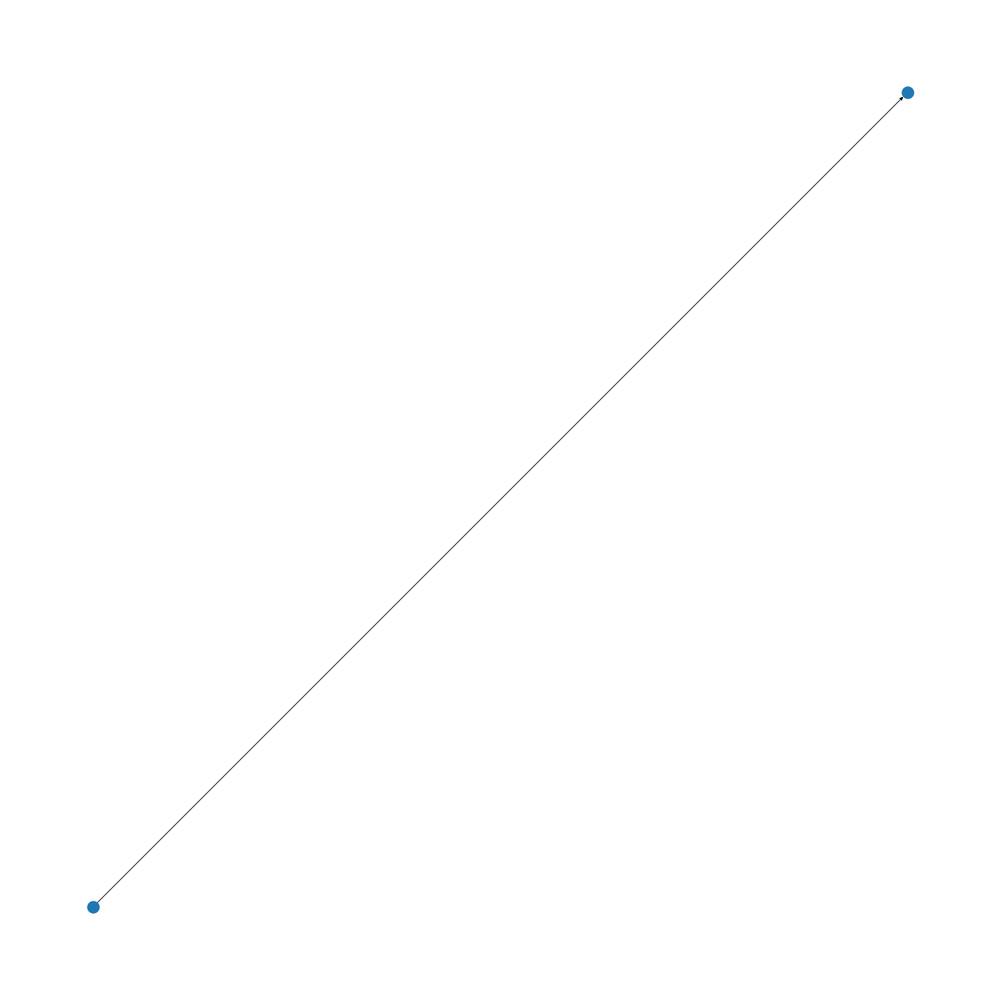

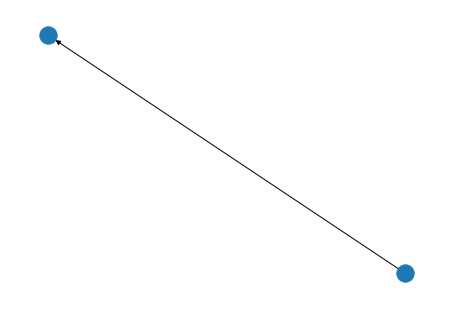

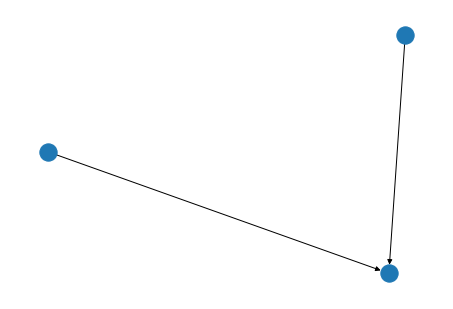

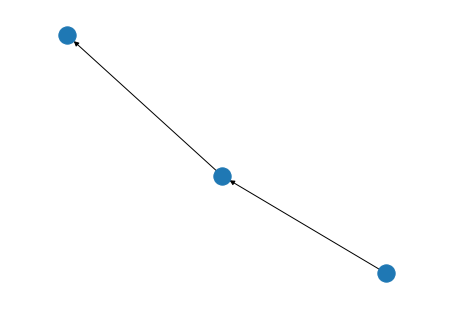

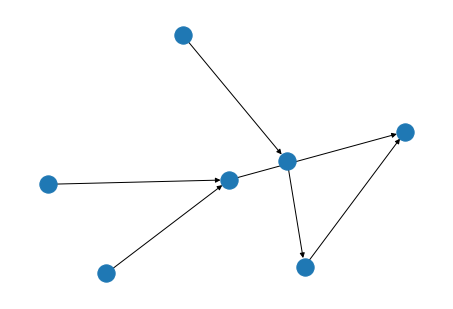

...

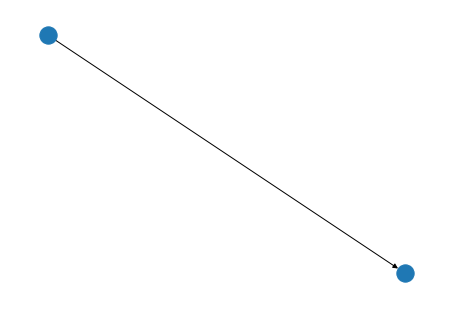

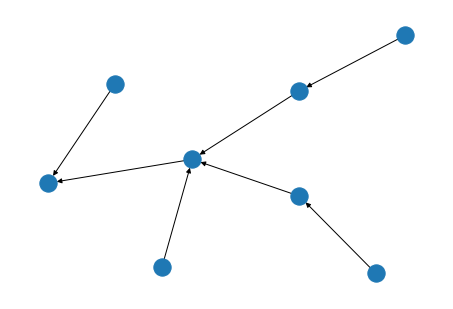

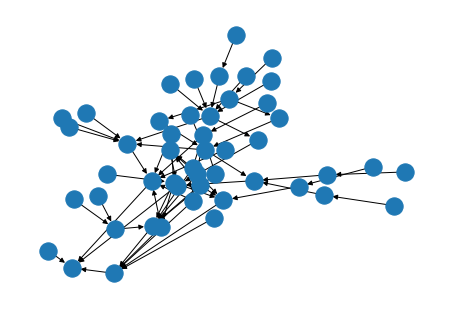

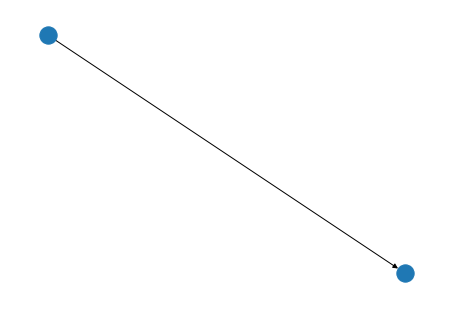

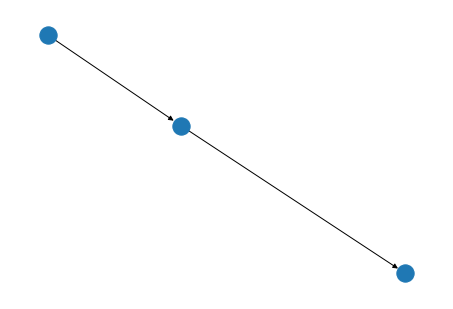

KeyboardInterrupt: 

In [53]:
plt.figure(figsize=(20,20))
for idx,file in enumerate(juul_filenames):
    G = nx.read_gpickle(os.path.join(os.getcwd(),juul_graph,file))
    nx.draw(G)
    plt.show()

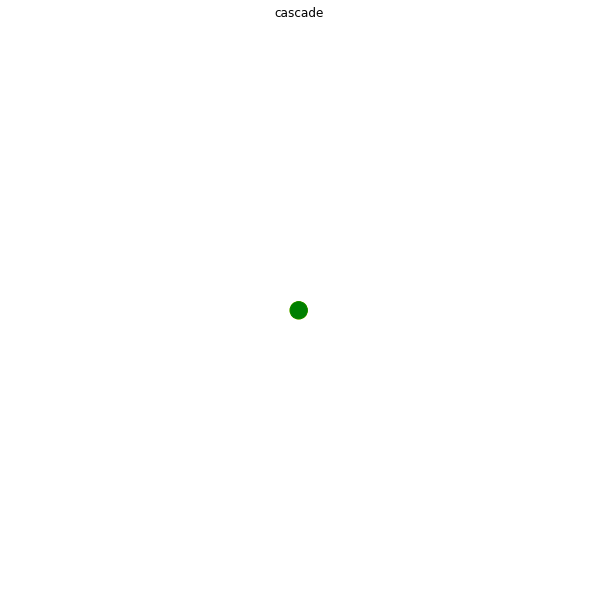

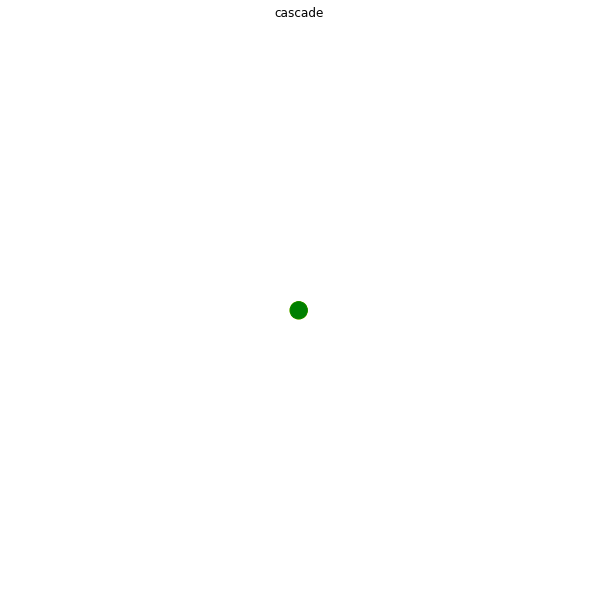

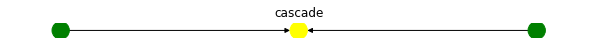

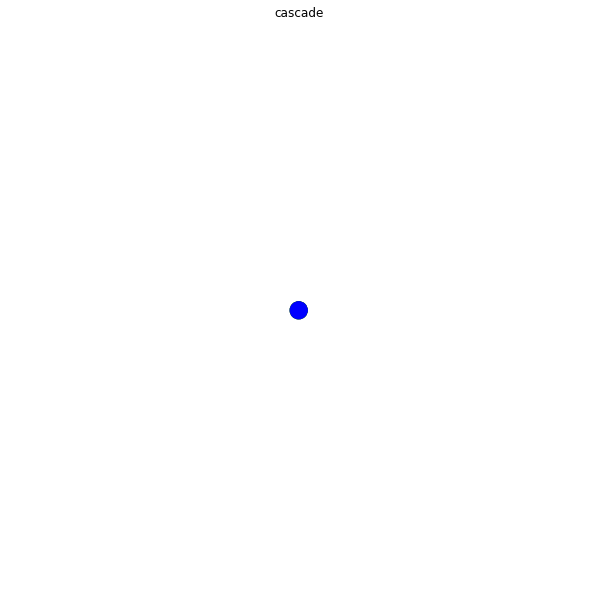

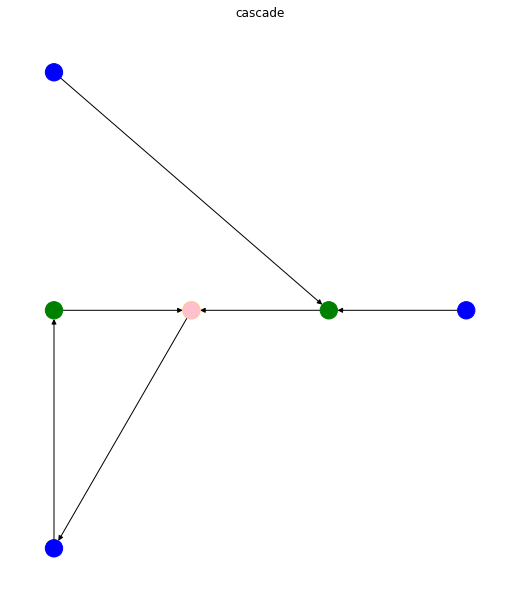

...

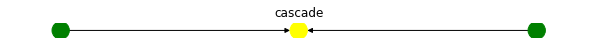

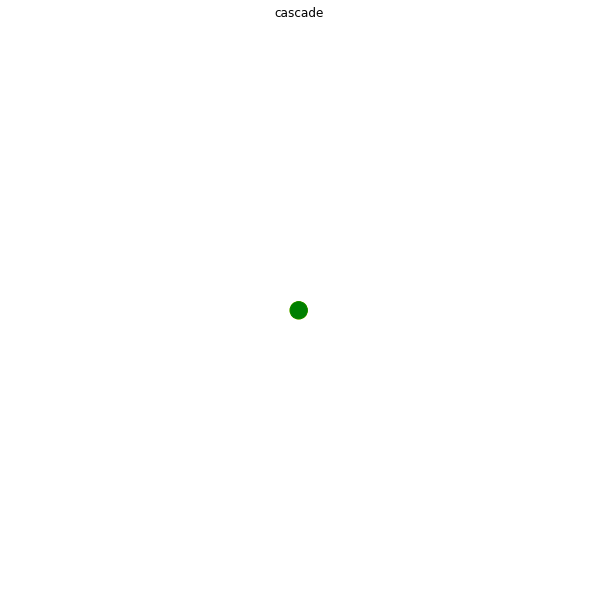

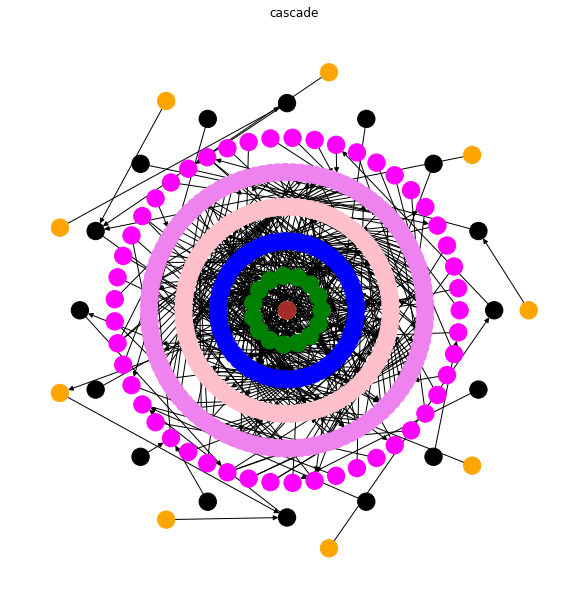

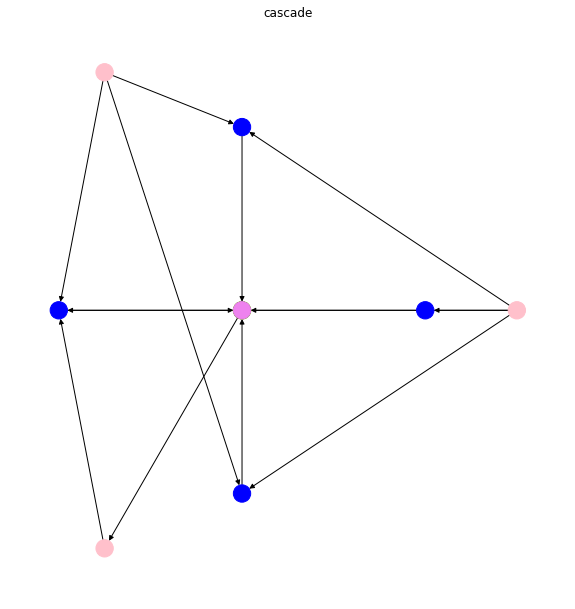

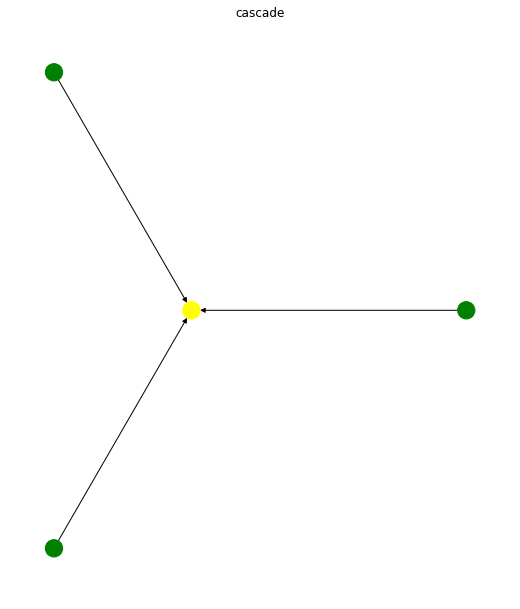

In [54]:
for idx,file in enumerate(juul_filenames):
    G = nx.read_gpickle(os.path.join(os.getcwd(),juul_graph,file))
    plot(G)

In [17]:
import operator
def get_depth(G):
    level = nx.get_node_attributes(G,'level')
    if not level:
        level = nx.get_node_attributes(G,'depth')
    depth = max(level.items(), key=operator.itemgetter(1))[1]
    return depth

In [18]:
## return fraction of nodes at each depth
def get_fraction_nodes_depth(G):
    nodes_depth = nx.get_node_attributes(G,'level')
    if (not nodes_depth):
        nodes_depth = nx.get_node_attributes(G,'depth')
    depth_nodes = list()
    depth = 0
    for depth in np.arange(10):
        if(len([k for k,v in nodes_depth.items() if v == depth])):
            depth_nodes.append(len([k for k,v in nodes_depth.items() if v == depth]))   ## get all nodes at that depth
            depth +=1
        else:
            depth_nodes.append(0)
    total_nodes = np.sum(depth_nodes)
    fraction_nodes_depth = [np.sum(depth_nodes[idx:]/total_nodes) for idx,ele in enumerate(depth_nodes)]
    return fraction_nodes_depth

## get statistics

In [45]:
def get_fraction_node_depth(filenames,graph_path):
    plt.figure(figsize=(10,10))
    for file in filenames:
        G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
        nodes_at_depth = get_fraction_nodes_depth(G)
        nodes_at_depth[0] = 1 # depth zero as start node
        plt.plot(np.arange(len(nodes_at_depth)),nodes_at_depth,label=len(G.nodes()))
        plt.xlabel("depth of cascade", fontsize= 16)
        plt.ylabel("fraction of nodes at depth = x", fontsize = 16)
        plt.xticks(np.arange(len(nodes_at_depth)))
        plt.title("Fraction of node vs depth",fontsize =18)
    # plt.legend(title="no of nodes")
    plt.show()

In [20]:
def get_graph_nodes(filenames,graph_path):
    nodes = []
    for file in filenames:
        G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
        nodes.append(len(G.nodes()))
    return nodes

## Initial metrics

In [ ]:
## total no of cascades
df_retweets = get_unique_tweets(hexagon_data)
len(df_retweets)

In [22]:
## no of juul cascades
len(juul_filenames) # only 2% of the total data

828

In [23]:
## cascade properties
nodes = get_graph_nodes(juul_filenames,juul_graph)
print("max no of nodes in cascades",np.array(nodes).max())
print("average no of nodes in cascades",np.array(nodes).mean())
print("minimum no of cascades",np.array(nodes).min())

max no of nodes in cascades 372
average no of nodes in cascades 6.295893719806763
minimum no of cascades 2


In [100]:
np.quantile(np.array(nodes),0.99)

43.460000000000036

In [31]:
depth_list = []
graph_path = juul_graph
for file in juul_filenames:
    G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
    depth = get_depth(G)
    depth_list.append(get_depth(G))

In [34]:
print("mean depth",np.mean(depth_list))
print("max depth", np.max(depth_list))
print("min depth",np.min(depth))

mean depth 1.7705314009661837
max depth 9
min depth 1


In [1]:
len(juul_filenames)

NameError: name 'juul_filenames' is not defined

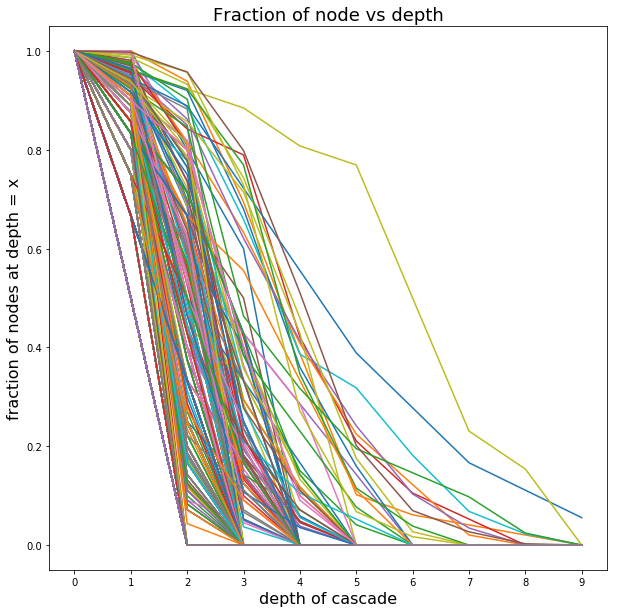

In [46]:
nodes_depth = get_fraction_node_depth(juul_filenames,juul_graph)

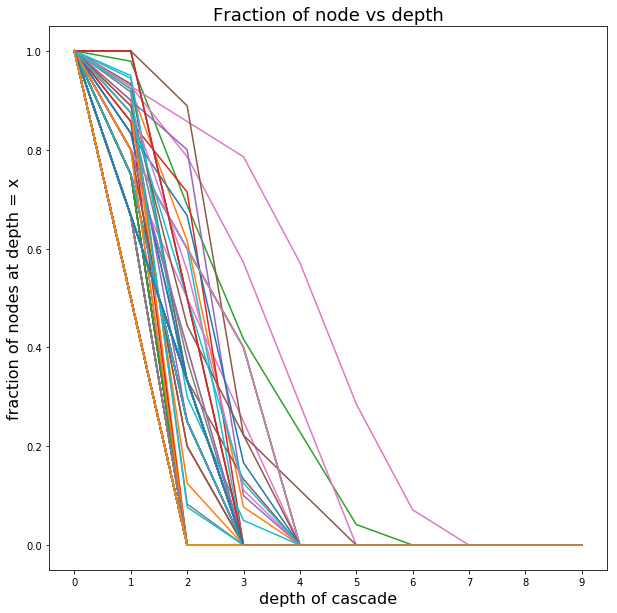

In [59]:
get_fraction_node_depth(weed_filenames,weed_graph)

In [30]:
def get_adoption(G):
        adoption = dict()
        adopt = list()
        level = nx.get_node_attributes(G,'level')
        if not level:
            for i in range(10):
                node_s = [node for node in G.nodes if G.nodes[node]['depth'] == i]
                if (node_s):
                    for node in node_s:
                        if (G.nodes[node]['followers']):
                            temp = (float(G.out_degree(node)) / float(G.nodes[node]['followers'])) 
                            adopt.append(temp)
                    adoption[i] = np.mean(adopt)
                else:
                    adoption[i] = 0
        else:
            for i in range(10):
                node_s = [node for node in G.nodes if G.nodes[node]['level'] == i]
                if (node_s):
                    for node in node_s:
                        if (G.nodes[node]['followers']):
                            temp = (float(G.out_degree(node)) / float(G.nodes[node]['followers']))
                            adopt.append(temp)    
                    adoption[i] = np.mean(adopt)
                else:
                    adoption[i] = 0
        return(adoption)

In [32]:
def get_adoption_rate(filenames, graph_path):
    plt.figure(figsize=(10,10))
    for file in filenames:
        G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
        adoption = get_adoption(G)
        plt.plot(adoption.keys(),adoption.values(),label=(len(G.nodes())))
    plt.xlabel("depth")
    # plt.legend(title="no of nodes")
    plt.ylabel("adoption rate")
    plt.title("adoption curve")
    plt.show()

/home/xavlock2345/anaconda3/envs/metis-env/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/xavlock2345/anaconda3/envs/metis-env/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


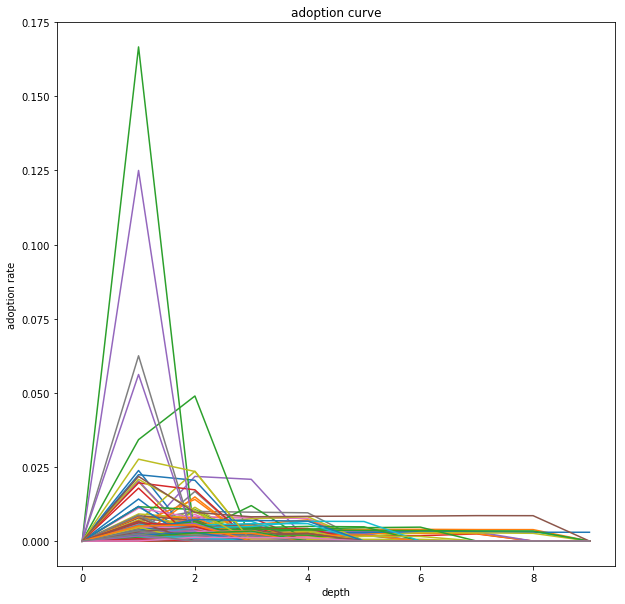

In [50]:
get_adoption_rate(juul_filenames,juul_graph)

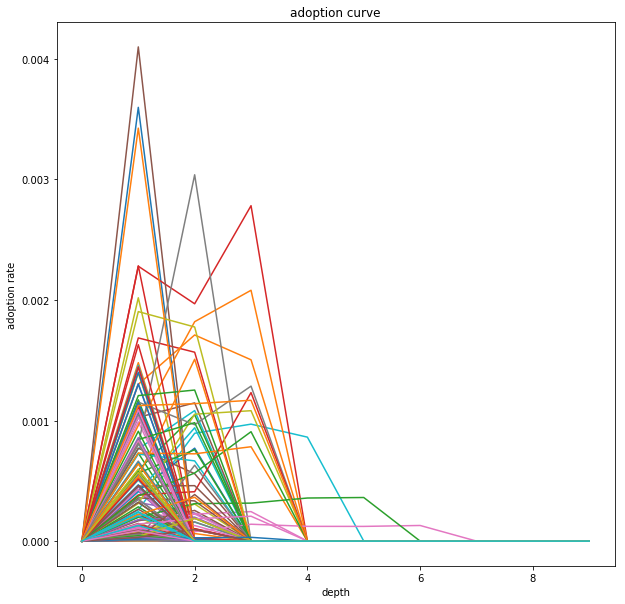

In [34]:
get_adoption_rate(weed_filenames,weed_graph)

In [62]:
# the graph should be between size vs weiner index (size represented in log level)
import matplotlib.cm as cm
import math
def get_weiner_index(filenames,graph_path):
    plt.figure(figsize=(5,5))
    size = list()
    weiner_index_l = list()
    for file in filenames:
        G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
        depth = get_depth(G)
        weiner_index = nx.average_shortest_path_length(G)
        size.append(np.log10(len(G.nodes)))
        weiner_index_l.append(weiner_index)
    plt.figure(figsize=(10,10))
    plt.xlabel("Cascade size (log base 10)",fontsize=16)
    plt.ylabel("weiner_index",fontsize=16)
    plt.title("cascade vs weiner index",fontsize=18)
    colors = cm.rainbow(np.linspace(0, 1, len(weiner_index_l)))
    plt.scatter(size,weiner_index_l,color=colors)
    plt.xticks([i for i in np.arange(0,10,2)])
    plt.show()

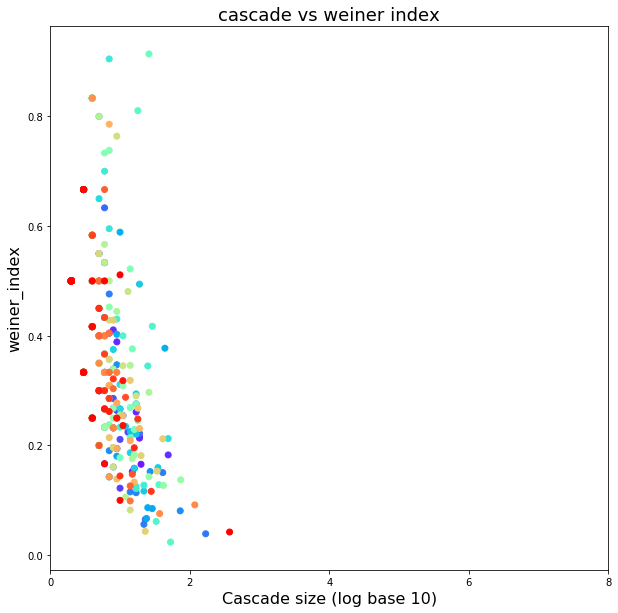

In [63]:
get_weiner_index(juul_filenames,juul_graph)

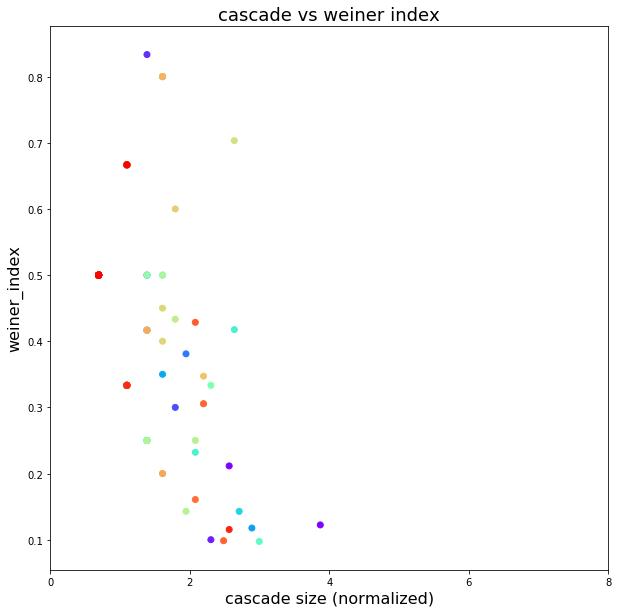

In [51]:
get_weiner_index(weed_filenames,weed_graph)

## cascade history

In [71]:
def search(elapse_list,element):
    for idx,ele in enumerate(elapse_list):
        if ele > element:
            return idx
    return (len(elapse_list))

In [97]:
def get_time_series(times,total_time):
    elapsed = list()
    for i in range(len(times)):
        temp = times[i] - times[0]
        elapsed.append(temp.total_seconds())
    time_s = dict()
    time_s[0] = 0
    for i in np.arange(2,12,2):
        time_l = ((i * total_time) / 10)
        pos = search(elapsed,time_l)
        time_s[i] = pos / len(elapsed)
    return(time_s)

In [100]:
def get_time_cascade(data,filenames,graph_path):
    plt.figure(figsize=(10,10))
    for file in filenames:
        cascade = pd.DataFrame()
        G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
        cascade = pd.DataFrame()
        for node in G.nodes:
            temp = data.loc[data.userID == node]
            cascade = cascade.append(temp)
        df_cascade = cascade[['tweetCreatedAt','userID']]
        df_cascade['tweetCreatedAt'] = pd.to_datetime(df_cascade['tweetCreatedAt'])
        df_cascade = df_cascade.sort_values(by='tweetCreatedAt')
        time_series = list(df_cascade['tweetCreatedAt'])
        temp = df_cascade.values[-1].tolist()[0] - df_cascade.values[0].tolist()[0]
        total_time = temp.total_seconds()
        series = get_time_series(time_series,total_time)
        plt.plot(series.keys(),series.values(),label= len(G.nodes()),color="blue",marker="o")
    # plt.legend(title="no of nodes")
    plt.xlabel("normalized time",fontsize=16)
    plt.ylabel("fraction of cascades (normalized)",fontsize=16)
    plt.title("Rate of growth of cascade after its inception",fontsize=16)
    plt.xticks(np.arange(0,10,2))
    plt.show()

/home/xavlock2345/anaconda3/envs/metis-env/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


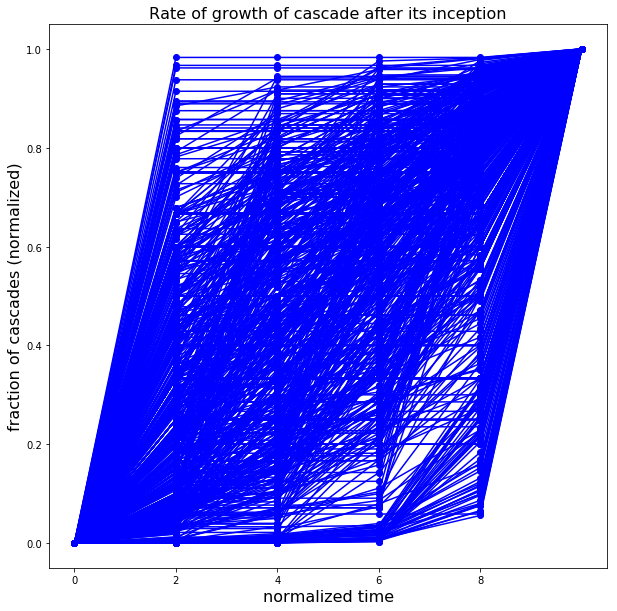

In [102]:
get_time_cascade(hexagon_data,juul_filenames,juul_graph)

/home/xavlock2345/anaconda3/envs/metis-env/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


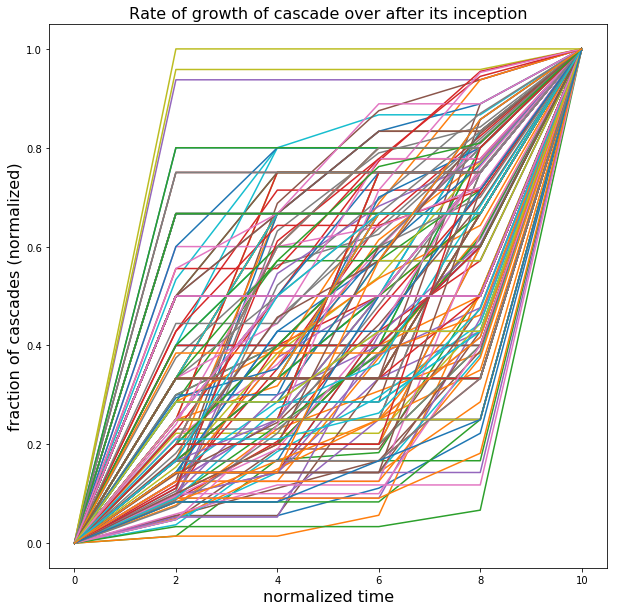

In [74]:
get_time_cascade(weed_filenames,weed_graph)

## mutual friends ccdf (with different depths)

In [92]:
def get_mutual_friends(mutual_friends,friends_data,G):
    for nodeA in tqdm(G.nodes()):
        for nodeB in (G.nodes()):
            friendsA = None
            friendsB = None
            if int(nodeA) in set(list(friends_data.userID)):
                friendsA = ast.literal_eval(list(friends_data.following.loc[friends_data.userID == int(nodeA)])[0])
                if int(nodeB) in set(list(friends_data.userID)):
                    friendsB = ast.literal_eval(list(friends_data.following.loc[friends_data.userID == int(nodeB)])[0])
                    if (friendsA and friendsB):
                        if (set(friendsA).intersection(set(friendsB))):
                            friends_m = (set(friendsA).intersection(set(friendsB)))
                            if(friends_m):
                                mutual_friends = update_dict(len(friends_m),mutual_friends)
                            else:
                                friends_m = 0
    return mutual_friends

In [93]:
def update_dict(element,dict_):
    for key,value in dict_.items():
        if element >= key:
            dict_[key] += 1
    return(dict_) # return updated dictioary

In [94]:
def normalized_dict(dict_):
    total = dict_[0]
    for key,value in dict_.items():
        if (value):
            dict_[key] = value/total
        else:
            dict_[key] = 0
    return dict_

In [97]:
# mutual friends ccdf among pair of nodes in cascades:
mut_friends_d1 = {0:0,10:0,20:0,30:0,40:0,50:0,60:0,70:0,80:0,90:0,100:0,200:0,500:0,1000:0,}
mut_friends_d2 = {0:0,10:0,20:0,30:0,40:0,50:0,60:0,70:0,80:0,90:0,100:0,200:0,500:0,1000:0,}
mut_friends_d3 = {0:0,10:0,20:0,30:0,40:0,50:0,60:0,70:0,80:0,90:0,100:0,200:0,500:0,1000:0,}
mut_friends_d4 = {0:0,10:0,20:0,30:0,40:0,50:0,60:0,70:0,80:0,90:0,100:0,200:0,500:0,1000:0,}
count = {1:0,2:0,3:0,4:0}
for file in (juul_filenames):
    G = nx.read_gpickle(os.path.join(os.getcwd(),juul_graph,file))
    if  0 < len(G.nodes()) <= 50:
        mut_friends_d1 = get_mutual_friends(mut_friends_d1,friends_data,G) # get the updated dictionary
        count[1] += 1
    elif 50 < len(G.nodes()) <= 100:
        mut_friends_d2 = get_mutual_friends(mut_friends_d2,friends_data,G) # get the updated dictionary
        count[2] += 1
    elif 100 < len(G.nodes()) <= 200:
        mut_friends_d3 = get_mutual_friends(mut_friends_d3,friends_data,G) # get the updated dictionary
        count[3] += 1
    elif len(G.nodes()) > 300:
        mut_friends_d4 = get_mutual_friends(mut_friends_d4,friends_data,G) # get the updated dictionary
        count[4] += 1

NameError: name 'friends_data' is not defined

In [48]:
mut_friends_d1_ = normalized_dict(mut_friends_d1)
mut_friends_d2_ = normalized_dict(mut_friends_d2)
mut_friends_d3_ = normalized_dict(mut_friends_d3)
mut_friends_d4_ = normalized_dict(mut_friends_d4)

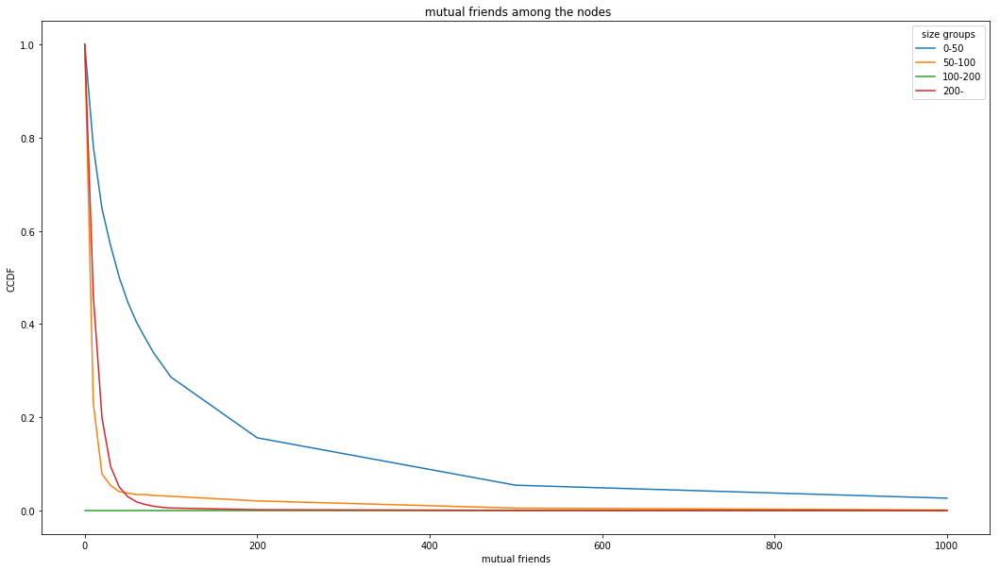

In [63]:
plt.figure(figsize=(18,10))
plt.plot(mut_friends_d1_.keys(), mut_friends_d1_.values(),label='0-50')
plt.plot(mut_friends_d2_.keys(), mut_friends_d2_.values(),label='50-100')
plt.plot(mut_friends_d3_.keys(), mut_friends_d3_.values(),label='100-200')
plt.plot(mut_friends_d4_.keys(), mut_friends_d4_.values(),label='200-')
plt.ylabel("CCDF")
plt.xlabel("mutual friends")
plt.title(" mutual friends among the nodes")
plt.legend(title='size groups')
plt.show()

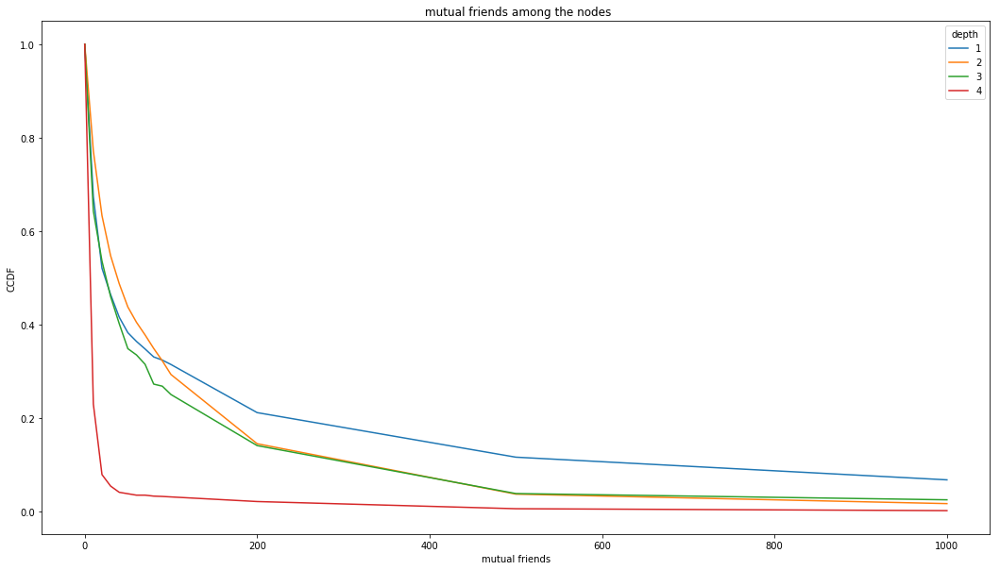

In [444]:
plt.figure(figsize=(18,10))
plt.plot(mut_friends_d1.keys(), mut_friends_d1.values(),label='0-50')
plt.plot(mut_friends_d2.keys(), mut_friends_d2.values(),label='50-100')
plt.plot(mut_friends_d3.keys(), mut_friends_d3.values(),label='100-200')
plt.plot(mut_friends_d4.keys(), mut_friends_d4.values(),label='200-')
# plt.xticks(list(mut_friends_d1.keys()))
plt.ylabel("CCDF")
plt.xlabel("mutual friends")
plt.title(" mutual friends among the nodes")
plt.legend(title='size groups')
plt.show()

## homophility

In [ ]:
## get the countries from location data..


## testing

In [536]:
counter = 0
for idx,file in enumerate(filenames):
    G = nx.read_gpickle(os.path.join(os.getcwd(),graph_path,file))
    if (G):
        print(idx,len(G.nodes()),file)
    else:
        print("here")
        os.remove(os.path.join(os.getcwd(),graph_path,file))

0 2 G_2764364902_15.gpickle
1 8 G_juul_cascade.gpickle
2 2 G_151973643_4.gpickle
3 387 tattoo.gpickle
4 3 G_3.gpickle
5 8 G_2937602802_8.gpickle
6 6 G_16870853_7.gpickle


In [92]:
from authentication import Authenticate
from collections import deque

In [93]:
auth = Authenticate()
apis = deque(auth.api)

In [766]:
import datetime

In [511]:
G= nx.read_gpickle("/Users/akshayuppal/Desktop/thesis/twitter_juul/models/graphs/G_juul_cascade.gpickle")

In [750]:
df_cascade = cascade[['tweetCreatedAt','userID']]

In [840]:
series

{0: 0, 2: 0.5, 4: 0.75, 6: 0.875, 8: 0.875, 10: 1.0}

In [831]:
time_s

{0: 0, 2: 0.5, 4: 0.75, 6: 0.875, 8: 0.875, 10: 1.0}

In [790]:
np.arange(0,10,2)

array([0, 2, 4, 6, 8])

In [340]:
G.nodes()

NodeView((15247690, 16870853, 34342490, 22212944, 423906777, 207413706))

In [343]:
G.nodes[22212944]

{'friends': 1396, 'followers': 313, 'level': 1}

In [330]:
cas = Cascade()
df_tweets = cas.get_unique_tweets(hexagon_data)

In [464]:
set([1]) == set({1})

True